# Make bilby samples from a list of galaxy hosts

This is a script to make bilby samples from a list of galaxy hosts. 

- The list of galaxy hosts is provided in a csv
- Galaxies are ingested, and the following quantities are propagated to the bilby sample
    - ra
    - dec
    - dL prior needs to be updated for the SkySim cosmology

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from astropy.time import Time

plt.rcParams.update({

    # --- Figure Layout ---
    "figure.figsize": (6, 4),           # Default figure size in inches
    "figure.dpi": 150,                  # DPI for crisp rendering
    "savefig.dpi": 300,                 # Higher DPI for saved figures
    "figure.autolayout": True,          # Avoids label overlap

    # --- Font & Text ---
    "font.family": "monospace",             # Or "sans-serif" for modern look
    "font.serif": ["Terminal"],  # Matches many journals
    "font.size": 12,                    # Base font size
    "axes.titlesize": 14,               # Title font size
    "axes.labelsize": 13,               # Axis label size
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "mathtext.fontset": "dejavuserif",  # Matches the serif font

    # --- Line & Marker Styles ---
    "lines.linewidth": 1.8,
    "lines.markersize": 6,
    "lines.markeredgewidth": 0.7,

    # --- Axes ---
    "axes.linewidth": 1.0,              # Frame thickness
    "axes.labelpad": 6,                 # Padding between label and axis
    "axes.grid": True,
    "grid.alpha": 0.25,
    "grid.linestyle": "--",
    "grid.linewidth": 0.7,
    "axes.spines.top": False,           # Removes top spine
    "axes.spines.right": False,         # Removes right spine

    # --- Ticks ---
    "xtick.direction": "in",
    "ytick.direction": "in",
    "xtick.major.size": 5,
    "ytick.major.size": 5,
    "xtick.minor.size": 3,
    "ytick.minor.size": 3,
    "xtick.top": False,
    "ytick.right": False,

    # --- Legend ---
    "legend.frameon": False,
    "legend.handlelength": 2,
    "legend.handletextpad": 0.4,
    "legend.loc": "best",

    # --- Colors and Colormaps ---
    "image.cmap": "viridis",            # Good perceptually uniform default
    "axes.prop_cycle": plt.cycler("color", [
        "#1f77b4", "#ff7f0e", "#2ca02c",
        "#d62728", "#9467bd", "#8c564b",
        "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"
    ]),
})

In [9]:
def scanDir(dirpath):
    files = os.listdir(dirpath)
    print(f"All files in {dirpath}:",end="\n\n")
    for f in files:
        print(f)
    print()
    return

def scanFiles(dirpath,startingString):

    files = os.listdir(dirpath)
    
    relevantFiles = np.array(files)[np.array([f.startswith(startingString) for f in files])]
    print(f"All files that start with {startString}:",end="\n\n")
    for f in relevantFiles:
        print(f)
    return relevantFiles

def makeFig(data,ranges,filename,columnName):
    fig,ax = plt.subplots()
    ax.hist(data,bins=np.arange(ranges[0],ranges[1],step=abs(ranges[0]-ranges[1])/100),histtype='step')
    ax.set_title(filename)
    ax.set_xlabel(columnName)
    ax.set_ylabel("Counts / bin")
    plt.show()
    return fig,ax

def scanAndMakePlots(start,base,only=None):
    scanDir(base)
    
    relFiles = scanFiles(base,start)
    for f in relFiles:
        resultDF = pd.read_csv(os.path.join(base,f))
        if only==None:
            for col in resultDF.columns.values[1:]:
                data = resultDF[col]
                ranges = np.nanpercentile(data,(1,99))
                fig,ax = makeFig(data,ranges,f,col)
                del fig
        else:
            for col in only:
                data = resultDF[col]
                ranges = np.nanpercentile(data,(1,99))
                fig,ax = makeFig(data,ranges,f,col)
                del fig

        
    return 
        

In [10]:
startString="UniformParent,UniformWeight,"
baseDir = "/global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/"
scanAndMakePlots(startString,baseDir)

All files in /global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/:

UniformParent,rWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight.csv
UniformParent,yWeight,NSBH,aligned,withCBCParams.csv
UniformParent,StellarMassWeight,NSBH,precessing,withCBCParams.csv
 readme.md
UniformParent,rWeight,BBH,aligned,withCBCParams.csv
UniformParent,yWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight,NSBH,aligned,withCBCParams.csv
UniformParent,uWeight.csv
.ipynb_checkpoints
UniformParent,StellarMassWeight,BBH,precessing,withCBCParams.csv
UniformParent,uWeight,NSBH,aligned,withCBCParams.csv
old
UniformParent,uWeight,BBH,precessing,withCBCParams.csv
UniformParent,rWeight,NSBH,aligned,withCBCParams.csv
BBHs_0,precessing,sampledPlusSNR.csv
UniformParent,yWeight.csv
UniformParent,uWeight,NSBH,precessing,withCBCParams.csv
UniformParent,yWeight,BBH,aligned,withCBCParams.csv
BBHs_0,aligned,sampledPlusSNR.csv
UniformParent,rWeight.csv
UniformParent,Unifor


KeyboardInterrupt



All files in /global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/:

UniformParent,rWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight.csv
UniformParent,yWeight,NSBH,aligned,withCBCParams.csv
UniformParent,StellarMassWeight,NSBH,precessing,withCBCParams.csv
 readme.md
UniformParent,rWeight,BBH,aligned,withCBCParams.csv
UniformParent,yWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight,NSBH,aligned,withCBCParams.csv
UniformParent,uWeight.csv
.ipynb_checkpoints
UniformParent,StellarMassWeight,BBH,precessing,withCBCParams.csv
UniformParent,uWeight,NSBH,aligned,withCBCParams.csv
old
UniformParent,uWeight,BBH,precessing,withCBCParams.csv
UniformParent,rWeight,NSBH,aligned,withCBCParams.csv
BBHs_0,precessing,sampledPlusSNR.csv
UniformParent,yWeight.csv
UniformParent,uWeight,NSBH,precessing,withCBCParams.csv
UniformParent,yWeight,BBH,aligned,withCBCParams.csv
BBHs_0,aligned,sampledPlusSNR.csv
UniformParent,rWeight.csv
UniformParent,Unifor

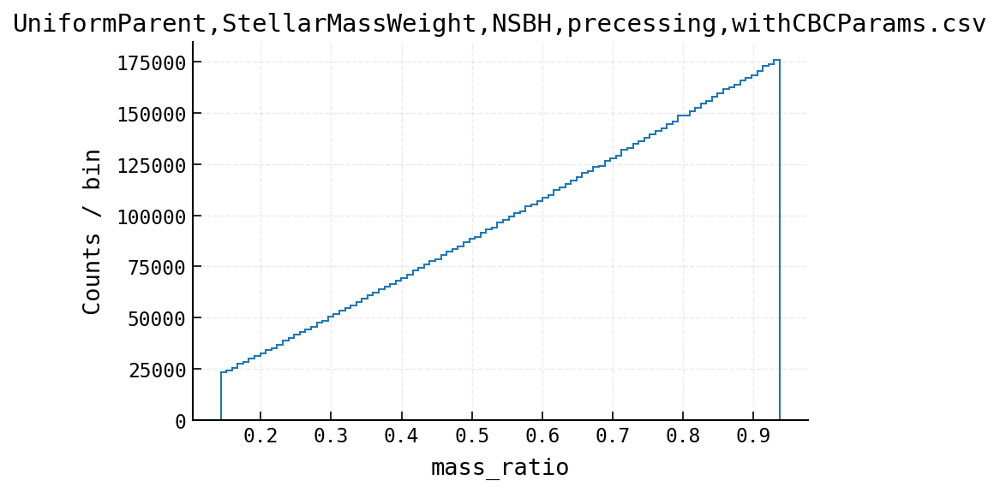

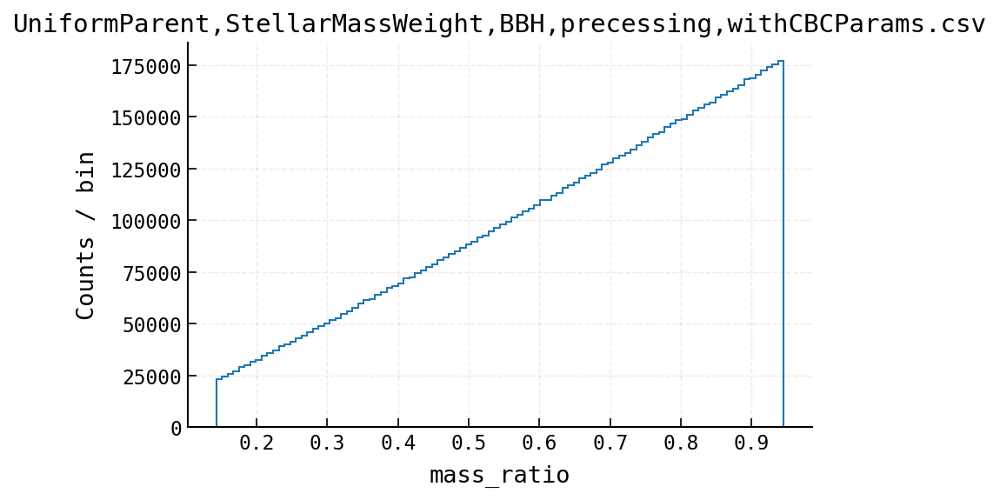

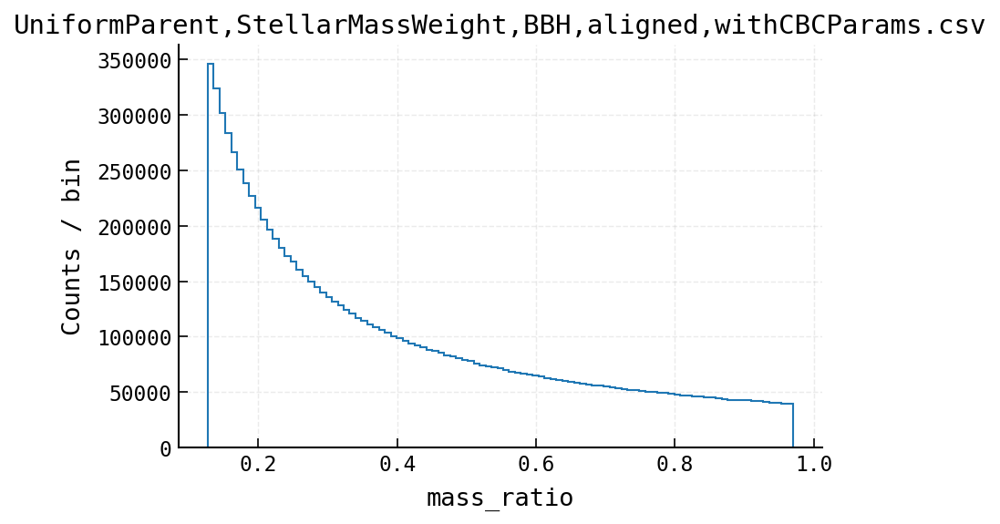

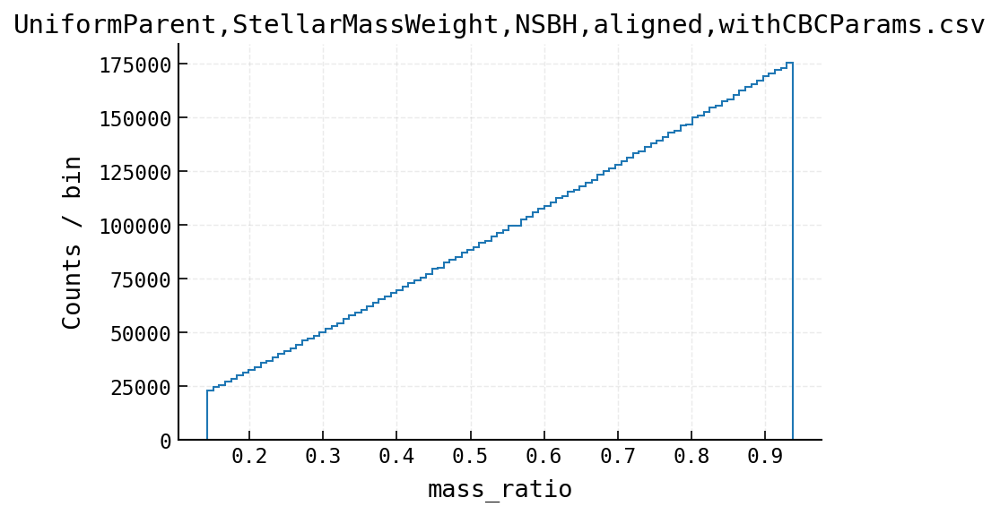

In [11]:
startString="UniformParent,StellarMassWeight,"
baseDir = "/global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/"
scanAndMakePlots(startString,baseDir,only=["mass_ratio"])

All files in /global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/:

UniformParent,rWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight.csv
UniformParent,yWeight,NSBH,aligned,withCBCParams.csv
UniformParent,StellarMassWeight,NSBH,precessing,withCBCParams.csv
 readme.md
UniformParent,rWeight,BBH,aligned,withCBCParams.csv
UniformParent,yWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight,NSBH,aligned,withCBCParams.csv
UniformParent,uWeight.csv
.ipynb_checkpoints
UniformParent,StellarMassWeight,BBH,precessing,withCBCParams.csv
UniformParent,uWeight,NSBH,aligned,withCBCParams.csv
old
UniformParent,uWeight,BBH,precessing,withCBCParams.csv
UniformParent,rWeight,NSBH,aligned,withCBCParams.csv
BBHs_0,precessing,sampledPlusSNR.csv
UniformParent,yWeight.csv
UniformParent,uWeight,NSBH,precessing,withCBCParams.csv
UniformParent,yWeight,BBH,aligned,withCBCParams.csv
BBHs_0,aligned,sampledPlusSNR.csv
UniformParent,rWeight.csv
UniformParent,Unifor

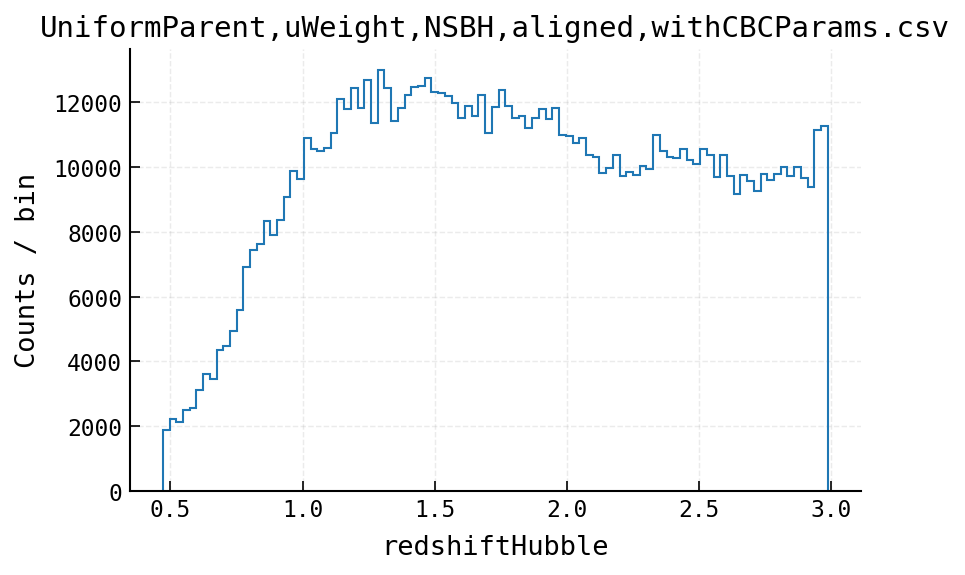

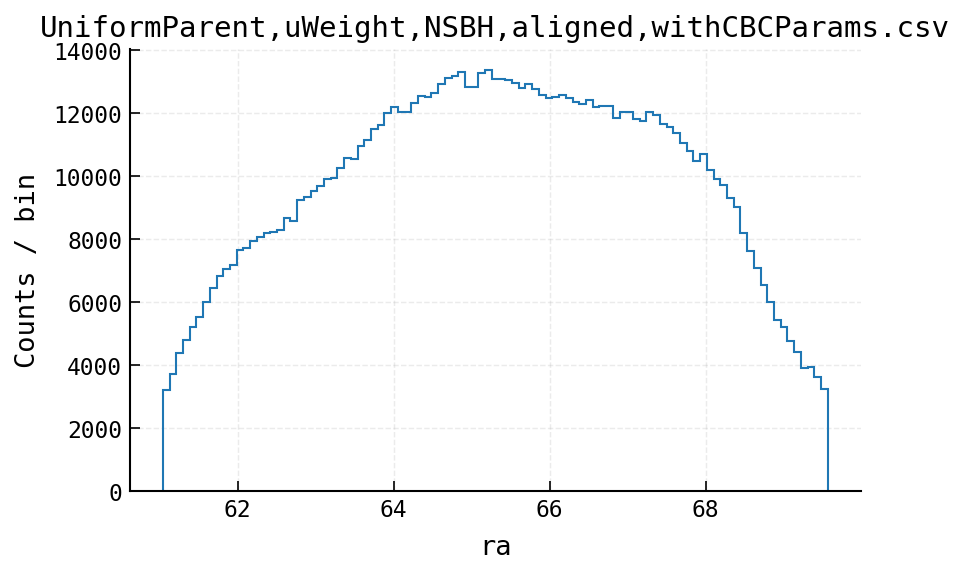

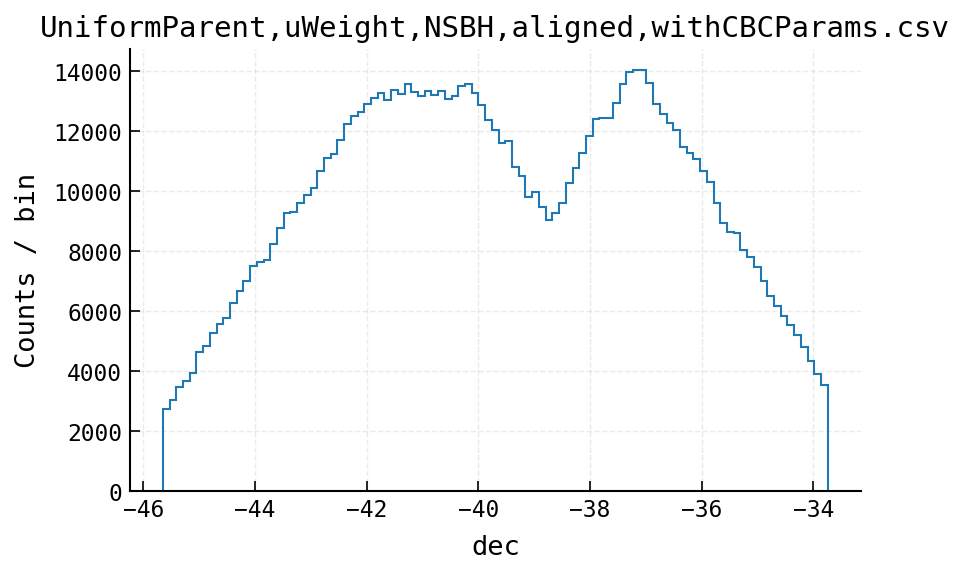

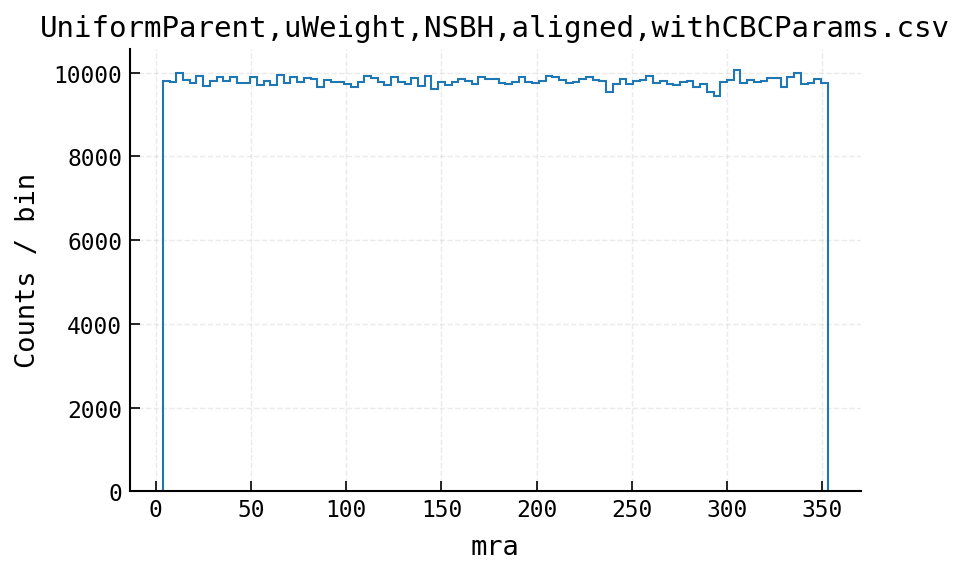

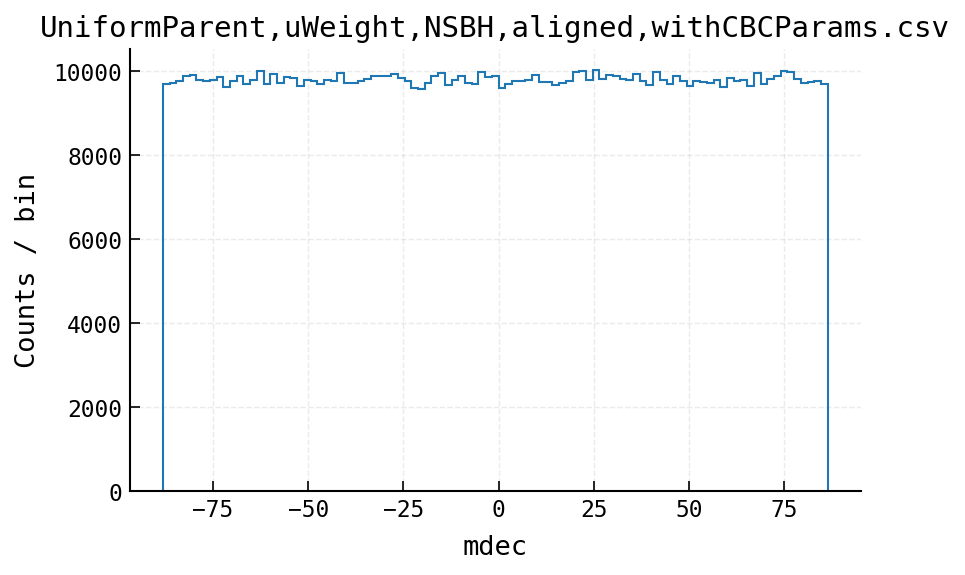

...

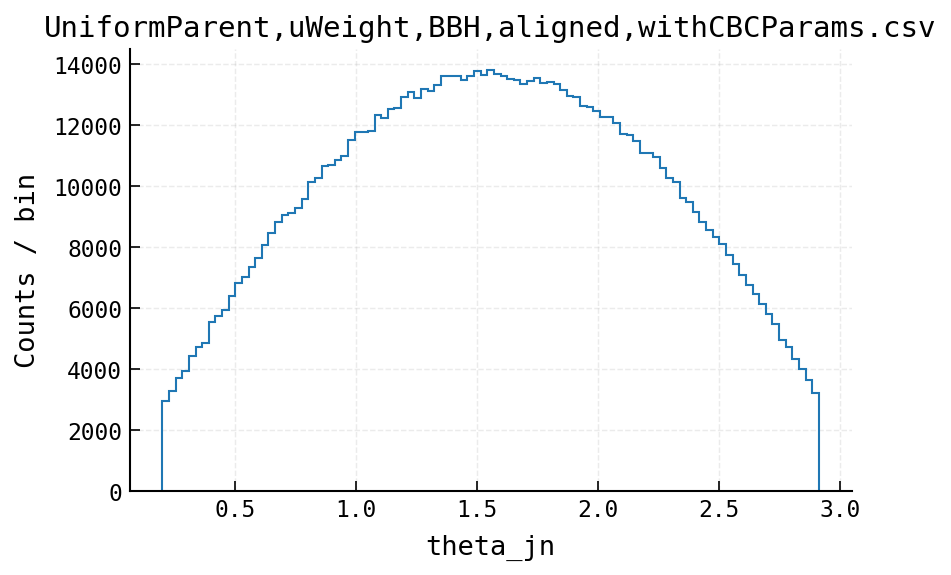

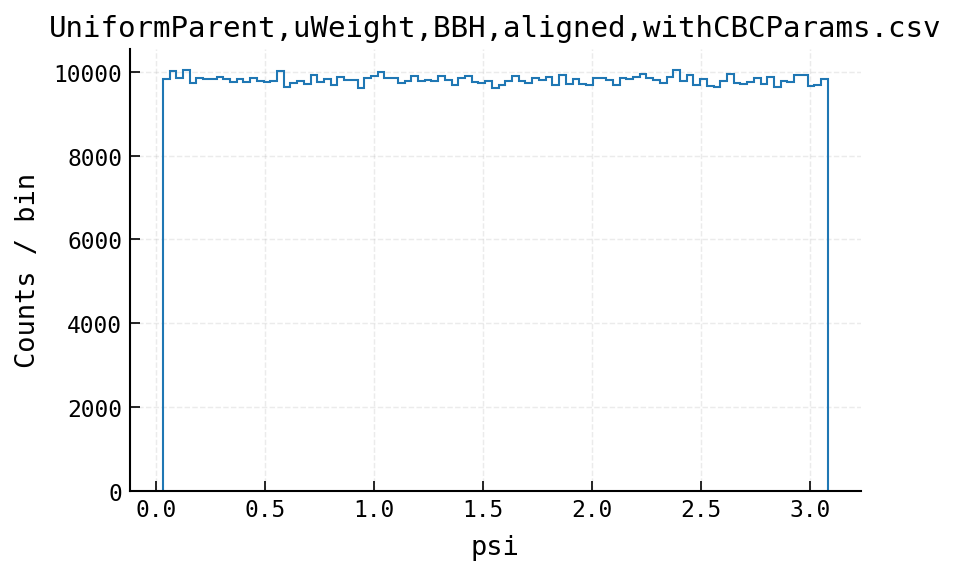

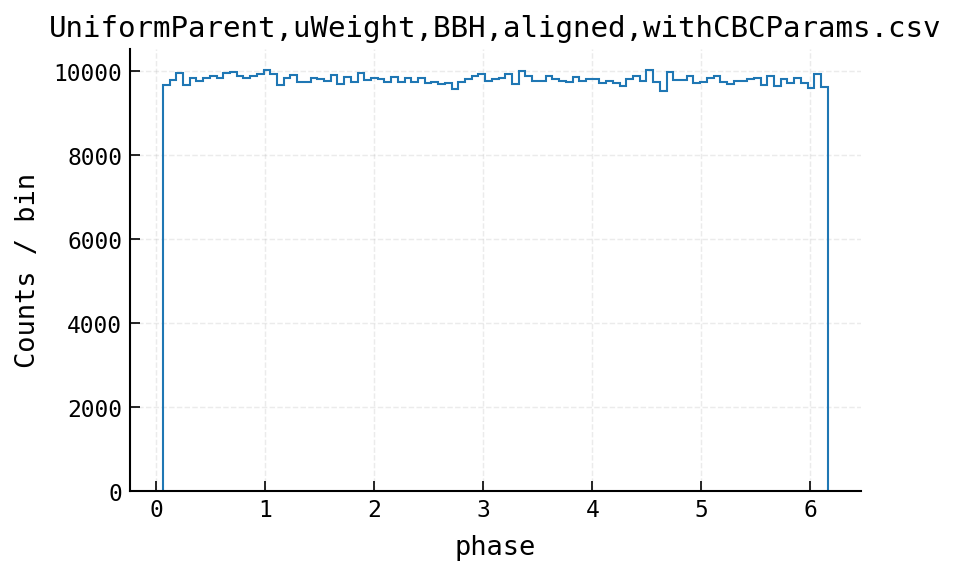

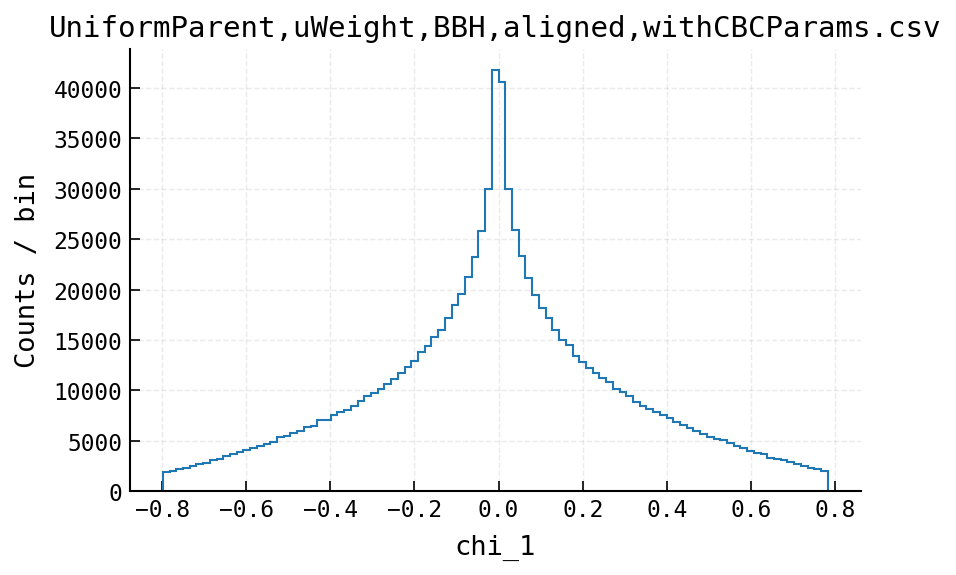

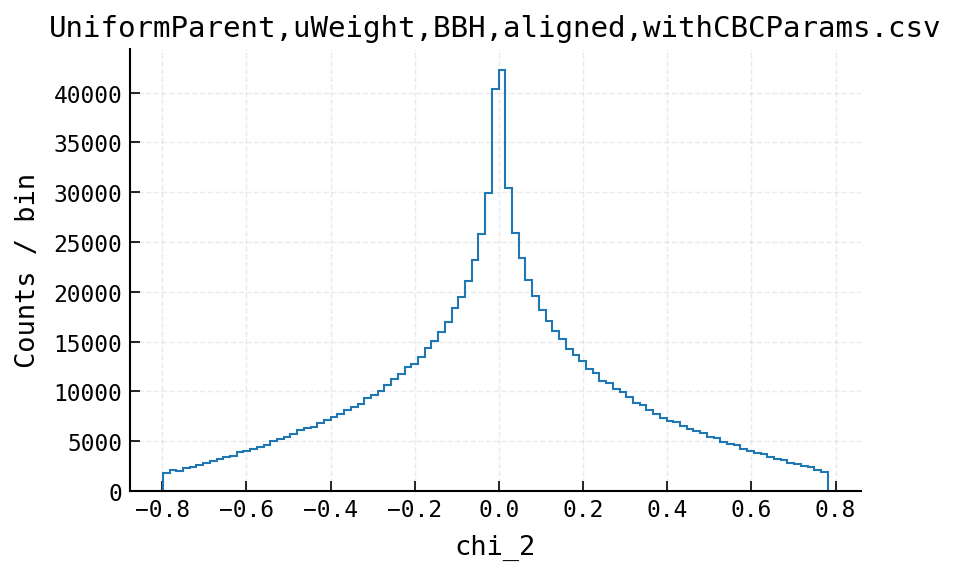

In [21]:
startString="UniformParent,uWeight,"
baseDir = "/global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/"
scanAndMakePlots(startString,baseDir)

All files in /global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/:

UniformParent,rWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight.csv
UniformParent,yWeight,NSBH,aligned,withCBCParams.csv
UniformParent,StellarMassWeight,NSBH,precessing,withCBCParams.csv
 readme.md
UniformParent,rWeight,BBH,aligned,withCBCParams.csv
UniformParent,yWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight,NSBH,aligned,withCBCParams.csv
UniformParent,uWeight.csv
.ipynb_checkpoints
UniformParent,StellarMassWeight,BBH,precessing,withCBCParams.csv
UniformParent,uWeight,NSBH,aligned,withCBCParams.csv
old
UniformParent,uWeight,BBH,precessing,withCBCParams.csv
UniformParent,rWeight,NSBH,aligned,withCBCParams.csv
BBHs_0,precessing,sampledPlusSNR.csv
UniformParent,yWeight.csv
UniformParent,uWeight,NSBH,precessing,withCBCParams.csv
UniformParent,yWeight,BBH,aligned,withCBCParams.csv
BBHs_0,aligned,sampledPlusSNR.csv
UniformParent,rWeight.csv
UniformParent,Unifor

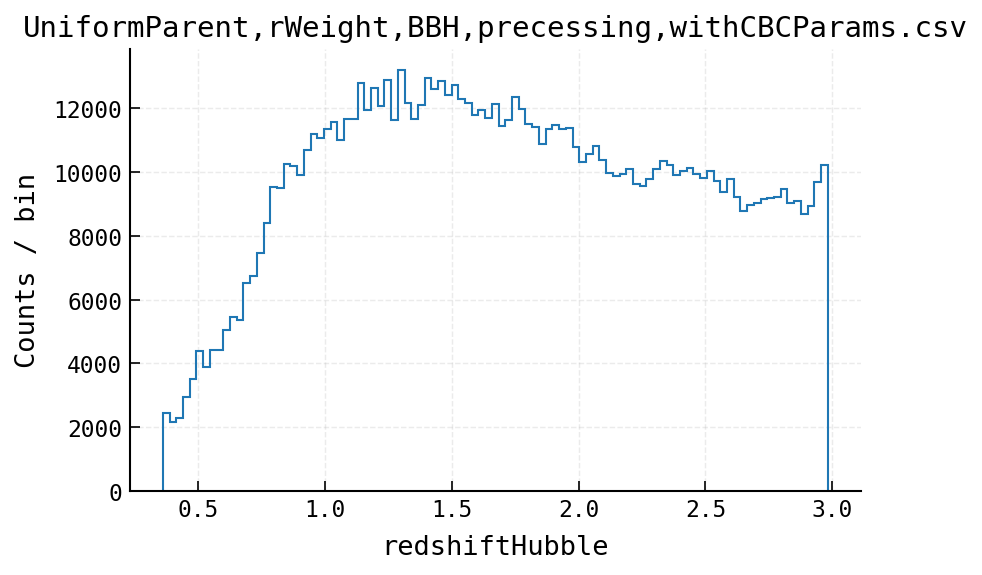

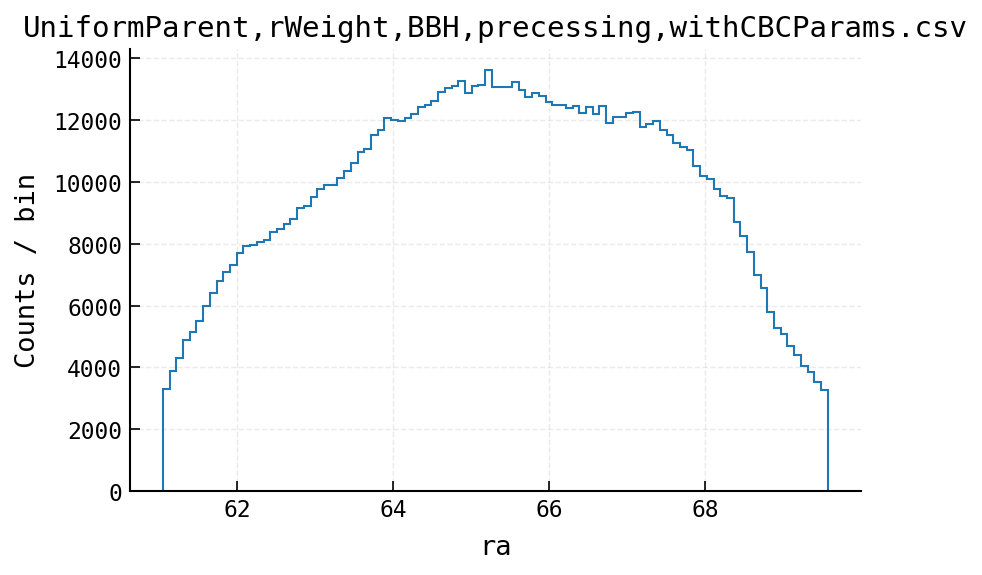

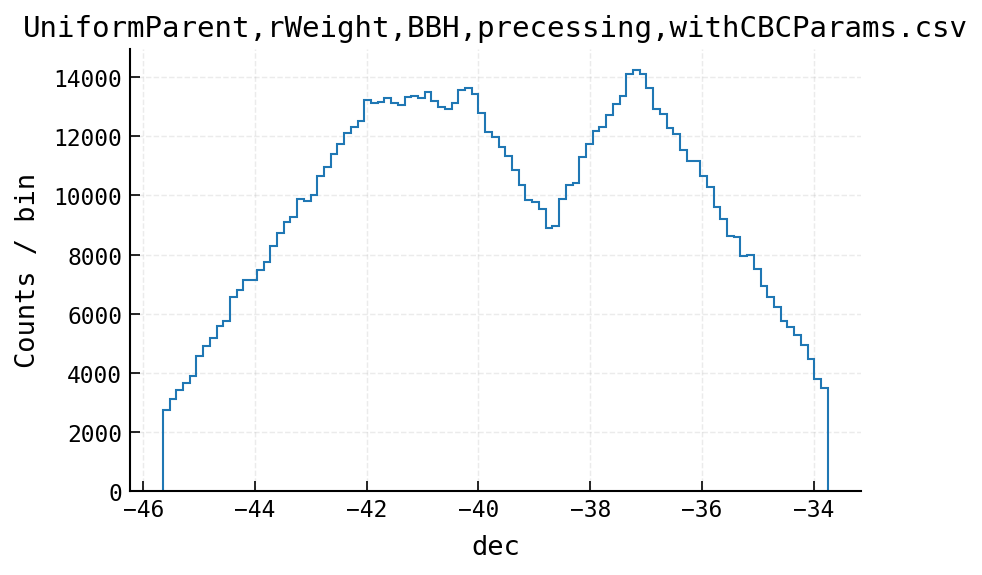

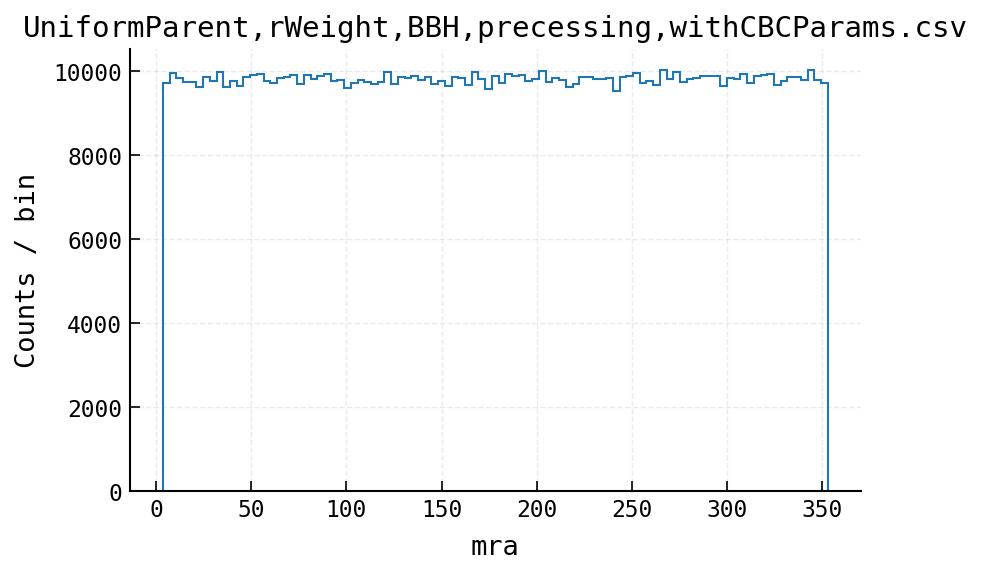

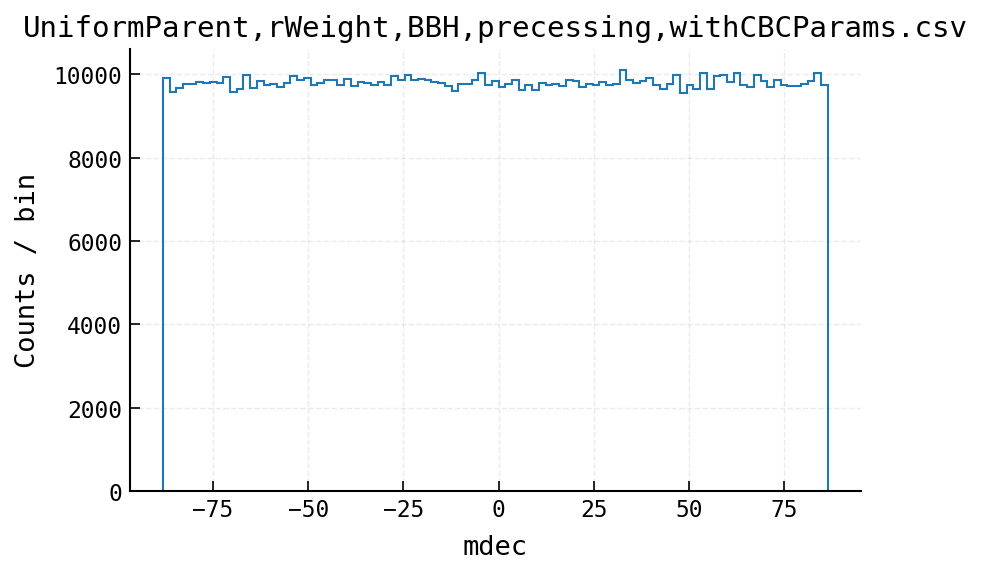

...

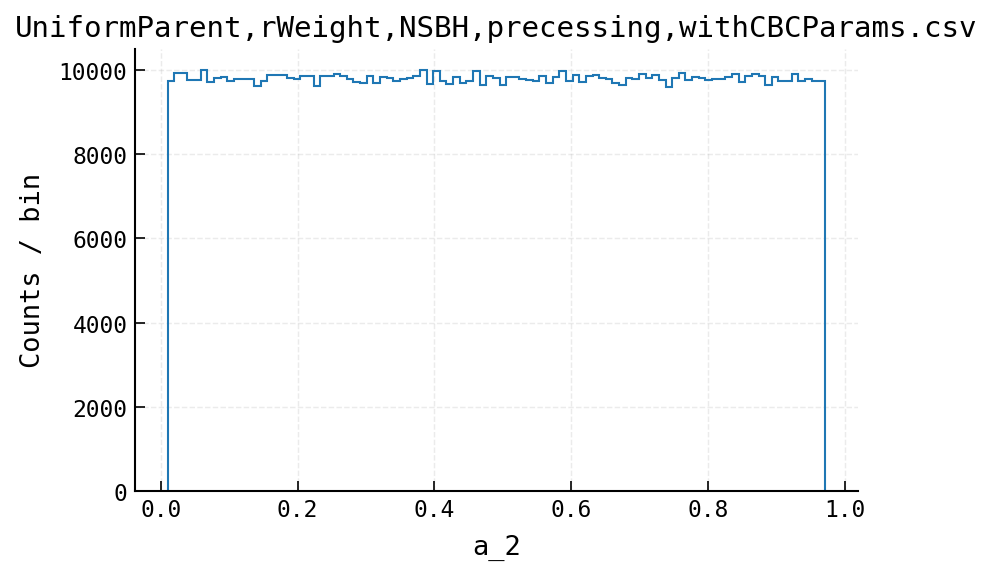

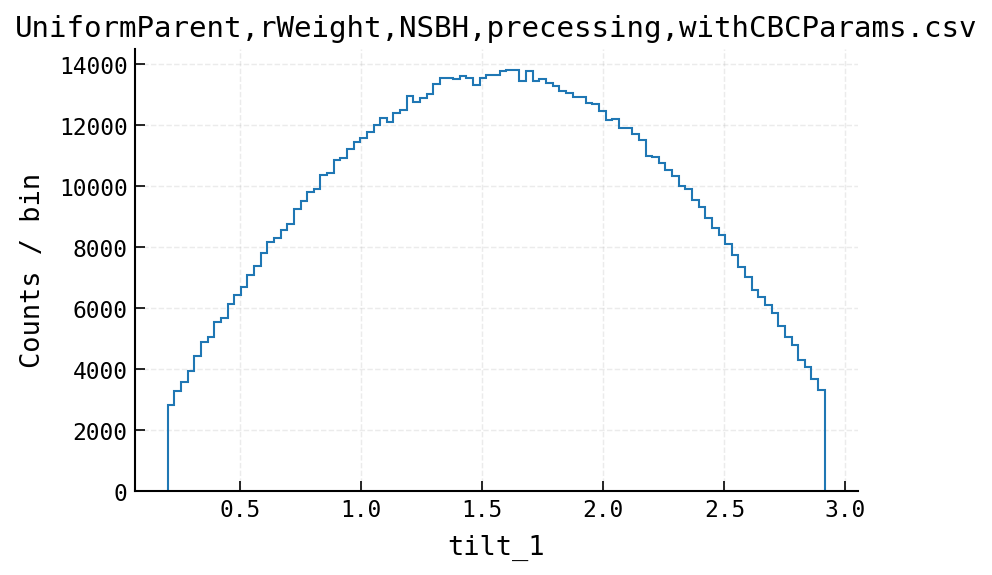

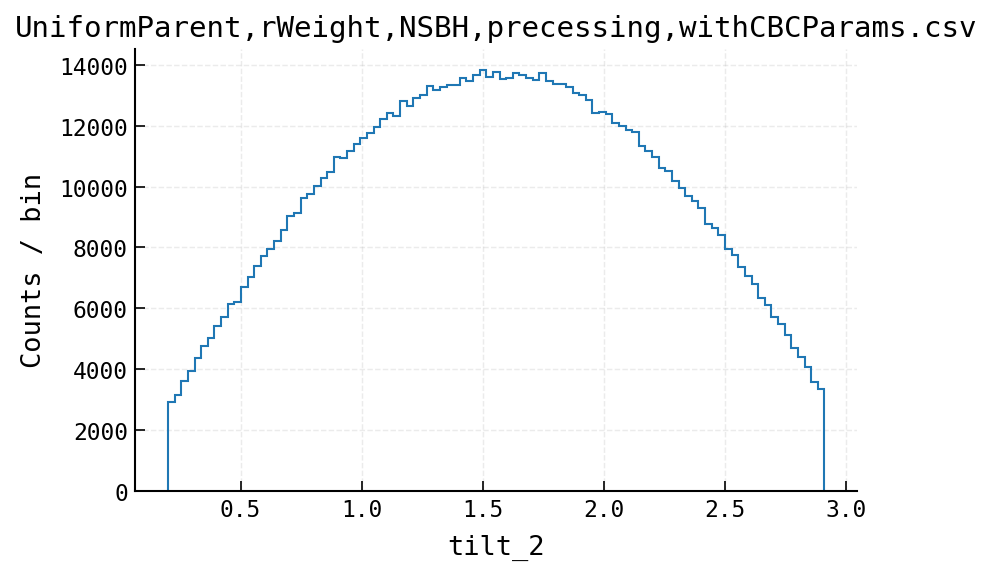

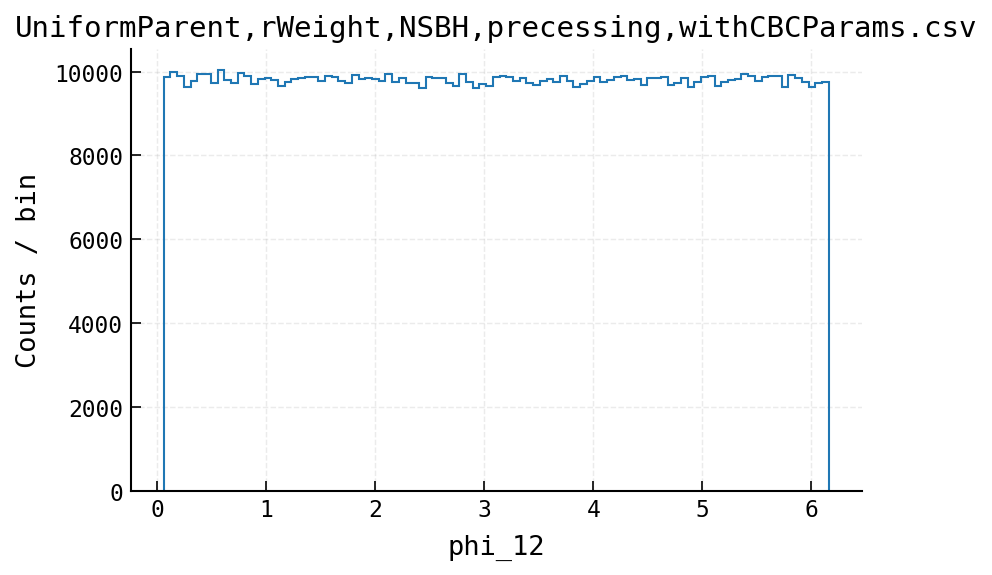

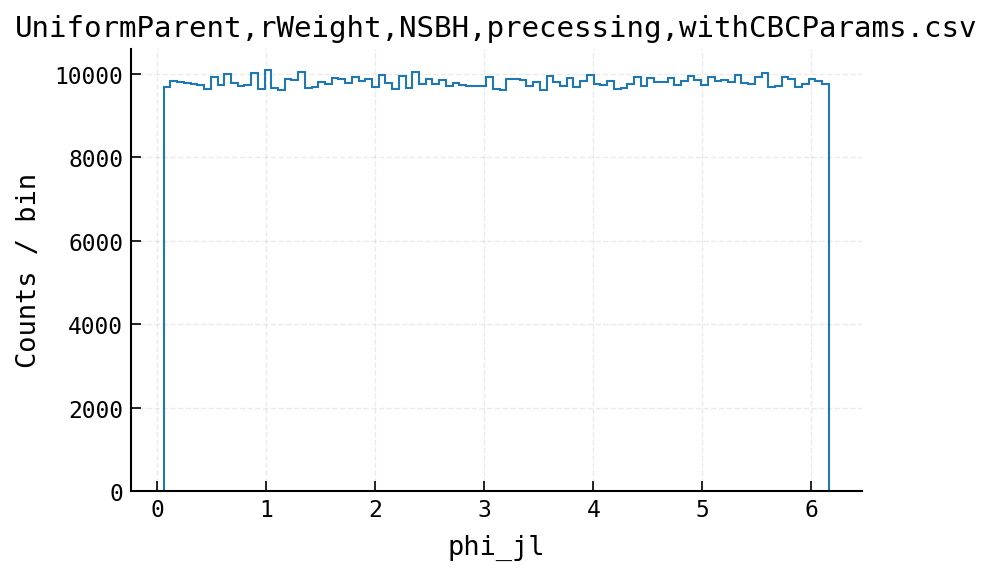

In [20]:
startString="UniformParent,rWeight,"
baseDir = "/global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/"
scanAndMakePlots(startString,baseDir)

All files in /global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/:

UniformParent,rWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight.csv
UniformParent,yWeight,NSBH,aligned,withCBCParams.csv
UniformParent,StellarMassWeight,NSBH,precessing,withCBCParams.csv
 readme.md
UniformParent,rWeight,BBH,aligned,withCBCParams.csv
UniformParent,yWeight,BBH,precessing,withCBCParams.csv
UniformParent,UniformWeight,NSBH,aligned,withCBCParams.csv
UniformParent,uWeight.csv
.ipynb_checkpoints
UniformParent,StellarMassWeight,BBH,precessing,withCBCParams.csv
UniformParent,uWeight,NSBH,aligned,withCBCParams.csv
old
UniformParent,uWeight,BBH,precessing,withCBCParams.csv
UniformParent,rWeight,NSBH,aligned,withCBCParams.csv
BBHs_0,precessing,sampledPlusSNR.csv
UniformParent,yWeight.csv
UniformParent,uWeight,NSBH,precessing,withCBCParams.csv
UniformParent,yWeight,BBH,aligned,withCBCParams.csv
BBHs_0,aligned,sampledPlusSNR.csv
UniformParent,rWeight.csv
UniformParent,Unifor

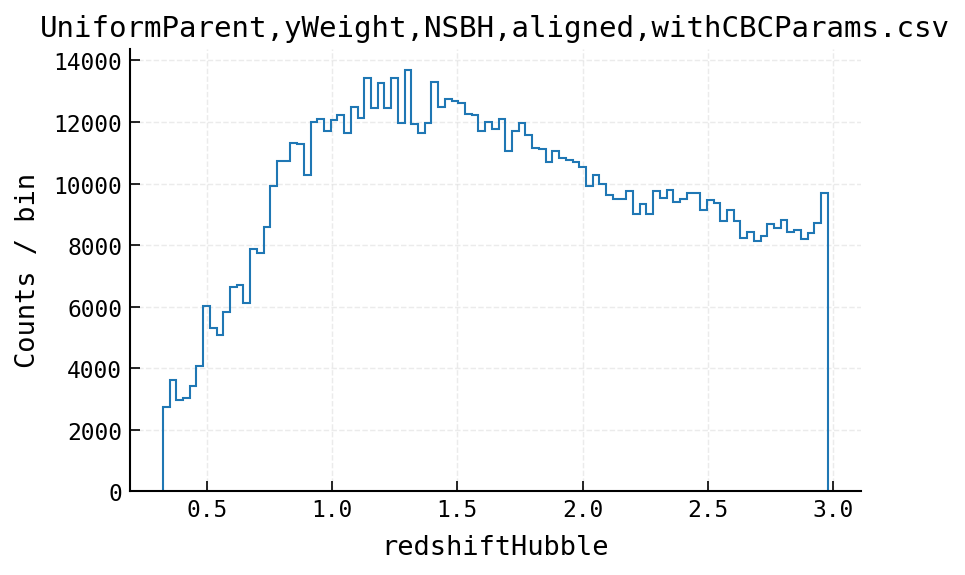

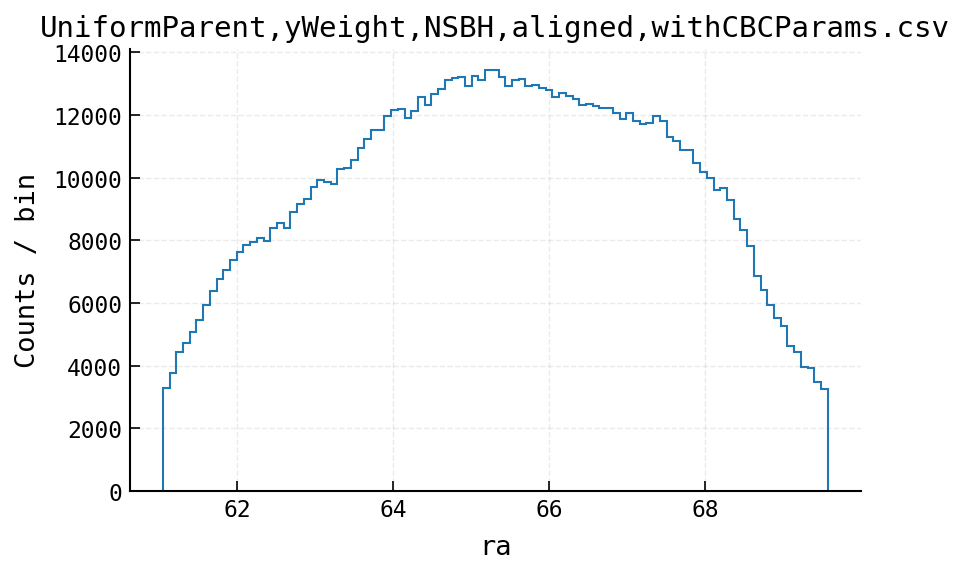

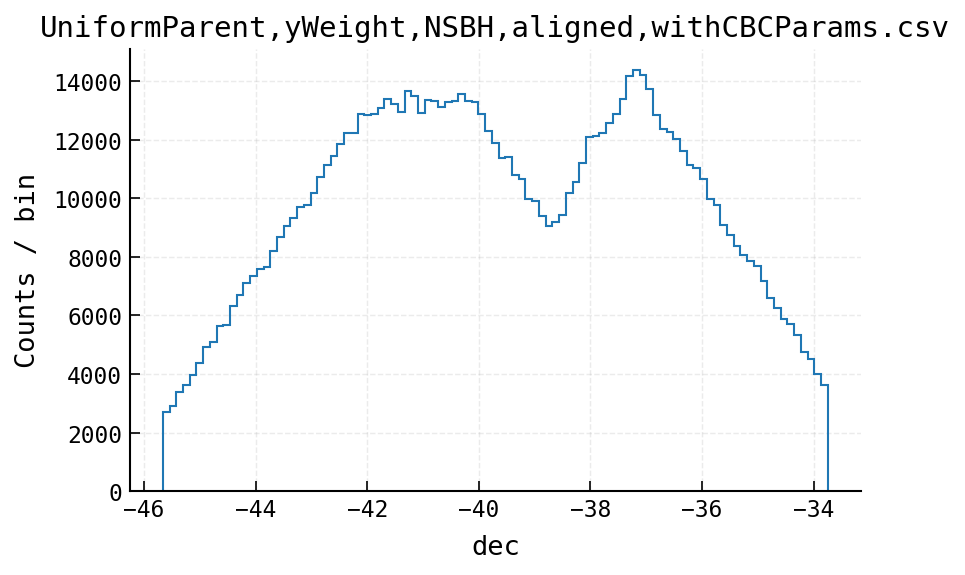

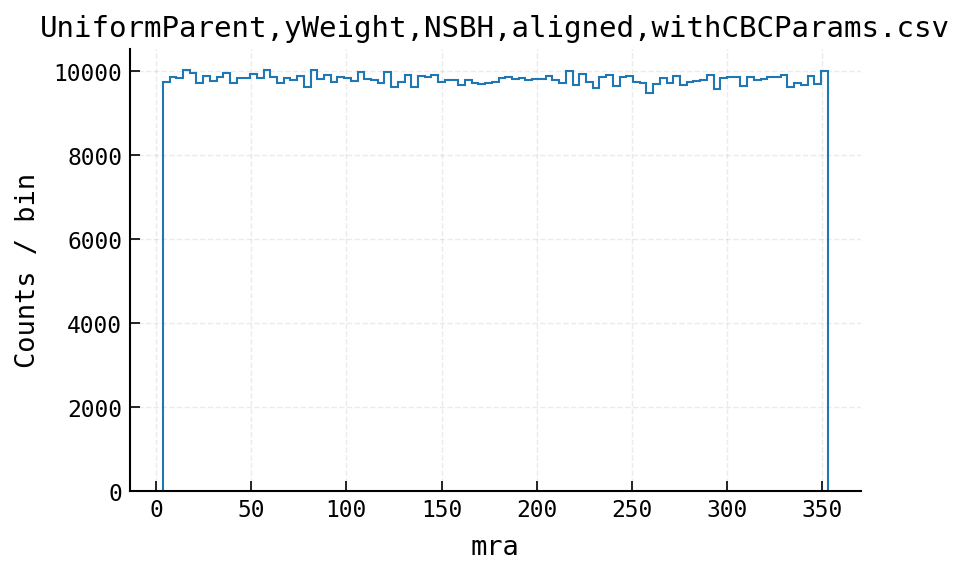

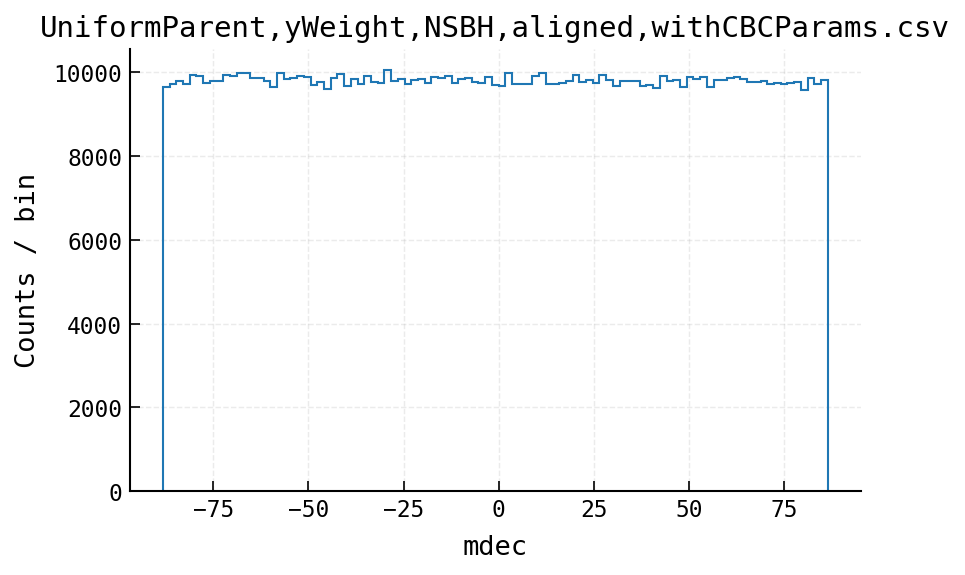

...

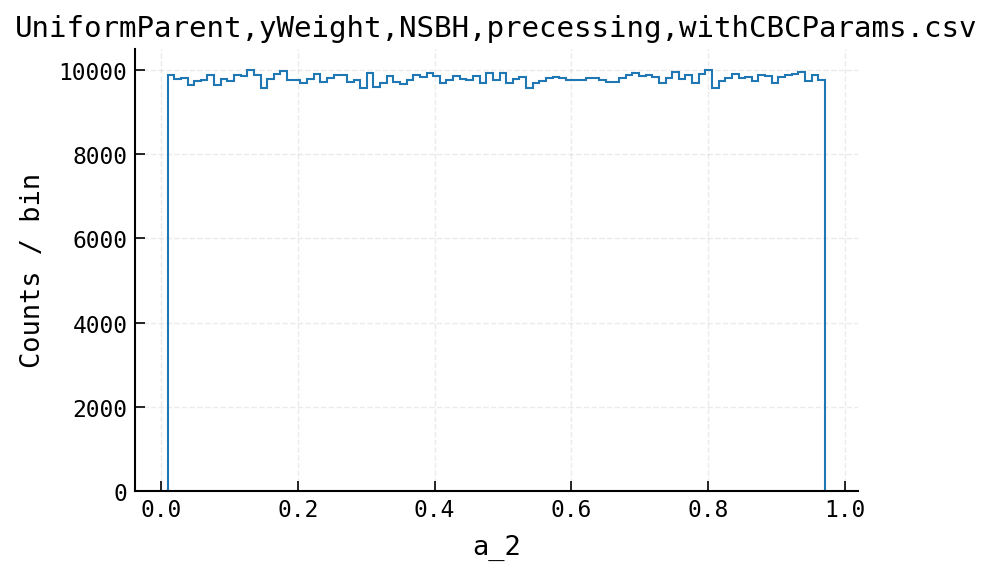

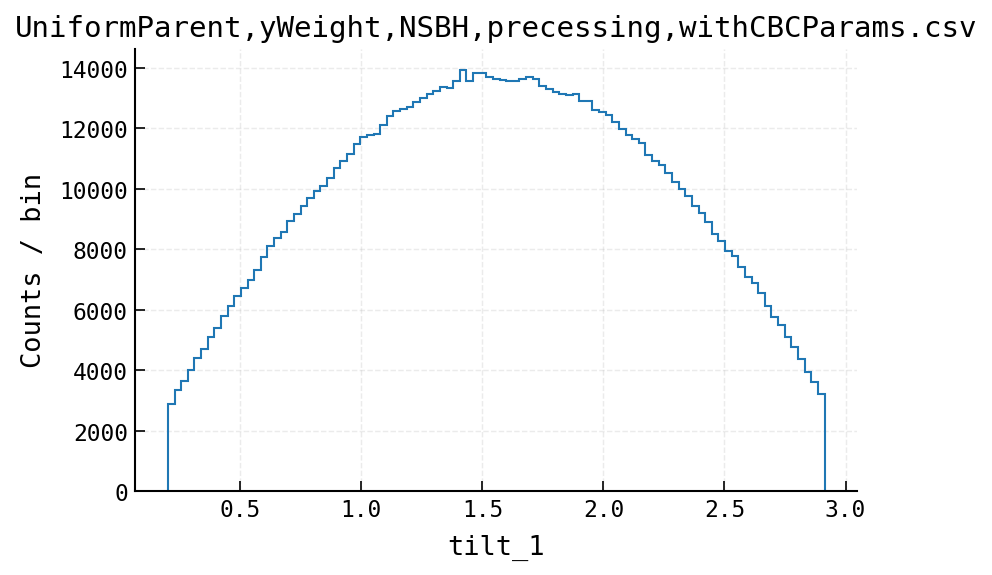

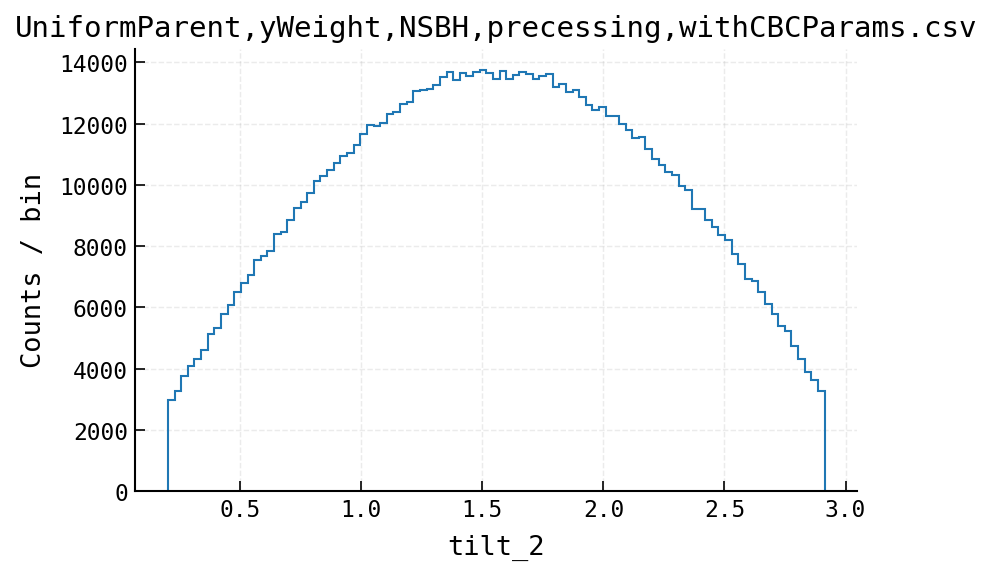

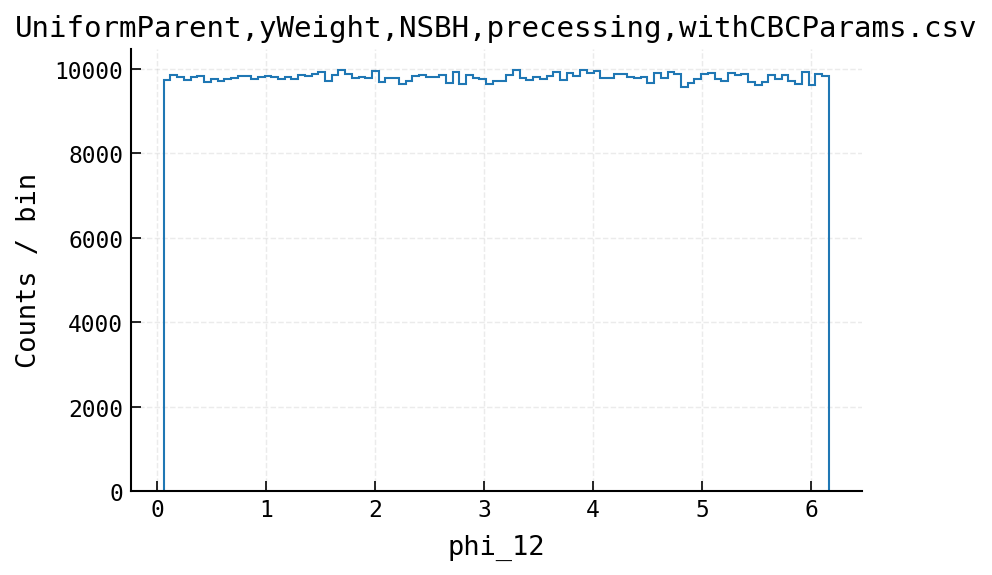

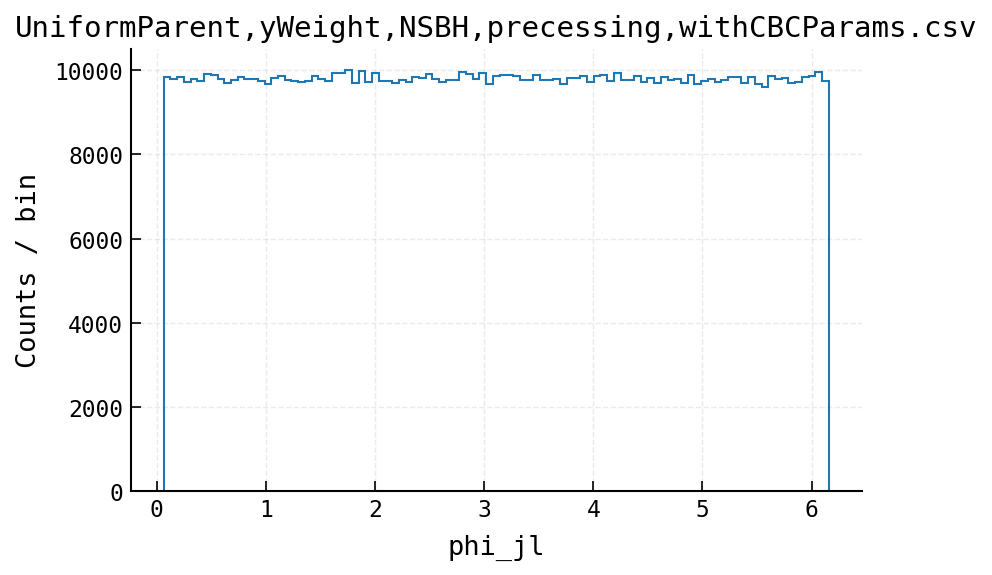

In [19]:
startString="UniformParent,yWeight,"
baseDir = "/global/u1/s/seanmacb/DESC/DESC-GW/gwStreetlights/data/mockCBCCatalog_csvs/"
scanAndMakePlots(startString,baseDir)